<a href="https://colab.research.google.com/github/piviki/skillfactory_DS/blob/main/hh_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:200px; rotation:-45>

<img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:200px;">

# <center> Проект: Анализ вакансий на hh.ru

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
#plt.style.use('default')

# **1. Исследование структуры данных**

### Задание 2.1
Прочитайте данные с помощью библиотеки Pandas.
Перед чтением обратите внимание на разделитель внутри файла

In [ ]:
hh_data = pd.read_csv('data/dst-3.0_16_1_hh_database (1).csv', sep =';')
#display(hh_data.head(3))

# чтобы не повредить оригинал DataFrame, сделаем его копию при помощи метода .copy()
hh_df = hh_data.copy()
display(hh_df.head(3))

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано


In [ ]:
#display(hh_df.tail(3))

In [ ]:
hh_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

In [ ]:
# rows amount check
hh_df['Пол, возраст'].shape[0] 

44744

#### Чему равна размерность таблицы? Введите её в виде кортежа (число строк, число столбцов).

In [ ]:
# (44744, 12)

### Задание 2.2
В каком формате представлен порядок слов в признаке «Пол, возраст»?

In [ ]:
# удобно можно воспользоваться методом .unique()
hh_df['Пол, возраст'].unique()

array(['Мужчина ,  39 лет , родился 27 ноября 1979',
       'Мужчина ,  60 лет , родился 20 марта 1959',
       'Женщина ,  36 лет , родилась 12 августа 1982', ...,
       'Мужчина ,  20 лет , родился 4 октября 1998',
       'Женщина ,  48 лет , родилась 26 декабря 1970',
       'Мужчина ,  38 лет , родился 25 апреля 1980'], dtype=object)

In [ ]:
# ответ: формат слов в признаке: <Пол , возраст , дата рождения>

### Задание 2.3
Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице

Какой тип данных имеют все столбцы? Введите его в поле для ответа

In [ ]:
# восрльзуемся методом .info()
# display(hh_df.info())

In [ ]:
# тип данных: object

### Задание 2.4
Обратите внимание на информацию о числе непустых значений.

Выберите все признаки, в которых есть пропуски в данных:

In [ ]:
# воспользуемся методом .isnull() и .mean()
# провдём сортировку методом .sort_values()
cols_null_percent = hh_df.isnull().mean() * 100 # умножим на 100%
cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)
display('Признаки, в которых есть пропуски в данных', cols_with_null)

'Признаки, в которых есть пропуски в данных'

Опыт работы                        0.375469
Последняя/нынешняя должность       0.004470
Последнее/нынешнее место работы    0.002235
dtype: float64

### Задание 2.5
Сколько уникальных значений содержится в столбце «Опыт работы»?

In [ ]:
# воспользуемся методом .unique() и применим .shape[0], чтобы получить число
hh_df['Опыт работы'].unique().shape[0]

44414

In [ ]:
#display(hh_data.describe())

#### Какая из искомых должностей самая распространённая? Введите название

In [ ]:
# воспользуемся методом .mode() ("мода")
hh_df['Ищет работу на должность:'].mode()

0    Системный администратор
dtype: object

# 2. Преобразование данных

мы познакомились с информацией в таблице, настало время самого сложного этапа — предобработки данных

Наши данные очень «сырые»: признаки представлены в неудобном для анализа и очистки формате.

Начнём с простого — с признака «Образование и ВУЗ». Его текущий формат — это: <Уровень образования год выпуска ВУЗ специальность...>. 

Например:

Высшее образование 2016 Московский авиационный институт (Национальный исследовательский университет)
Неоконченное высшее образование 2000 Балтийская государственная академия рыбопромыслового флота
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак «Образование», который должен иметь четыре категории: «высшее», «неоконченное высшее», «среднее специальное» и «среднее».

Выполните преобразование, ответьте на контрольные вопросы и удалите признак «Образование и ВУЗ».

Совет первый:
Обратите внимание на структуру текста в столбце «Образование и ВУЗ». Гарантируется, что текущий уровень образования соискателя всегда отражён в первых двух словах и начинается с заглавной буквы. Воспользуйтесь этим.

Совет второй:
Проверяйте полученные категории, например с помощью метода unique()

In [ ]:
# Создайте с помощью функции-преобразования новый признак «Образование», 
# который должен иметь четыре категории: «высшее», «неоконченное высшее», «среднее специальное» и «среднее»

In [ ]:
# проверим количество уникальных значений в столбце с помощью метода nunique()
print('количество уникальных значений в столбце Образование и ВУЗ:', hh_df['Образование и ВУЗ'].nunique())

количество уникальных значений в столбце Образование и ВУЗ: 40148


In [ ]:
# давайте извлечём из признака Образование и ВУЗ информацию 
# («высшее», «неоконченное высшее», «среднее специальное» и «среднее»)
# Для этого сначала внимательнее посмотрим на структуру признака, выберем несколько строк столбца Образование и ВУЗ
print(hh_df['Образование и ВУЗ'].iloc[0])
print(hh_df['Образование и ВУЗ'].iloc[1])
print(hh_df['Образование и ВУЗ'].iloc[2])

Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота, Калининград судоводительский, Организация и безопасность движения
Высшее образование 1981  Военно-космическая академия им. А.Ф. Можайского, Санкт-Петербург АСУ, АСУ
Среднее специальное образование 2002 Профессиональный лицей 39 г. Твери Экономический, Банковское дело


In [ ]:
# Создадим новый признак "Образование" при помощи фугкции education_level

"""Функция, которая возвращает уровень образования в новом признаке """

hh_df['Образование'] = hh_df['Образование и ВУЗ'].apply(lambda x: x.split(' образование')[0])

print(hh_df['Образование'].unique())

['Неоконченное высшее' 'Высшее' 'Среднее специальное' 'Среднее']


In [ ]:
# Посмотрим, сколько уникальных значений у нас получилось
print('Количество значений для образования:', hh_df['Образование'].nunique())

Количество значений для образования: 4


In [ ]:
# еще один вариант решения
# Создадим новый признак "Образование" при помощи фугкции education_level

#"""Функция, которая возвращает уровень образования в новом признаке """

#def education_level(arg):
    #arg = ' '.join(arg.split(' ')[:3]) #  разбиваем строку на слова по пробелу и в разрезе [:3], не включая границу 3
    #if 'Высшее' in arg: # проверяем условия нахождения уровня образования в строке
        #return 'высшее'
    #elif 'Неоконченное высшее' in arg:
        #return 'неоконченное высшее'
    #elif 'Среднее' in arg:
        #return 'среднее'
    #elif 'Среднее специальное' in arg:
        #return 'среднее специальное'
    #else:
        #return 'Нет информации'

#hh_df['Образование'] = hh_df['Образование и ВУЗ'].apply(education_level) # применяем занчение к каждому элементу 

#display('Новый признак Образование', hh_df['Образование'])

In [ ]:
# проверим, появился ли у нас новый признак "Образование"
# выведим две записи нашнй таблицы
#display(hh_df.head(2))

### Задание 3.1
Сколько соискателей имеет средний уровень образования (школьное образование)?

In [ ]:
# Посмотрим общую тнформацию по уровню образования
display(hh_df['Образование'].value_counts())
# 559 (ответ)

Высшее                 33863
Среднее специальное     5765
Неоконченное высшее     4557
Среднее                  559
Name: Образование, dtype: int64

#### Выполните преобразование, ответьте на контрольные вопросы и удалите признак «Образование и ВУЗ».

In [ ]:
# Преобразования выполнены
# Удаляем признак «Образование и ВУЗ» с помощью метода .drop() по столбцам axis=1
hh_df.drop(['Образование и ВУЗ'],axis=1,inplace=True)
#hh_df.head(2)

### Теперь нас интересует столбец «Пол, возраст»

Его текущий формат: <Пол , возраст, дата рождения>. 

Например:

Мужчина , 39 лет , родился 27 ноября 1979

Женщина , 21 год , родилась 13 января 2000

Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец..

Создайте два новых признака «Пол» и «Возраст». При этом важно учесть:

Признак пола должен иметь два уникальных строковых значения: М — мужчина, Ж — женщина.

Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак «Пол, возраст» из таблицы.

Совет:
Обратите внимание на структуру текста в столбце, а точнее на то, как разделены параметры пола, возраста и даты рождения между собой — символом ' , '.

Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.

### Создайте два новых признака «Пол» и «Возраст»

In [ ]:
# Выведем функцию get_age для вывода возраста

"""Функция, которая возвращает возраст кондидата """

def get_age(arg):
    arg_splitted = arg.split(' ') # разбивает строку на слова по пробелу
    words=['год', 'года', 'лет'] # Создаём список пометок
    for index, item in enumerate (arg_splitted): # циклом проходимся  по индексам и элементам
        if item in words:
            return int(arg_splitted[index-1]) 

hh_df['Возраст'] = hh_df['Пол, возраст'].apply(get_age) # создаем новый признак
display('Новый признак Возраст', hh_df['Возраст'])

'Новый признак Возраст'

0        39
1        60
2        36
3        38
4        26
         ..
44739    30
44740    27
44741    48
44742    24
44743    38
Name: Возраст, Length: 44744, dtype: int64

In [ ]:
# Выведем функцию get_gender для вывода пола

"""Функция, которая возвращает пол кондидата """
def get_gender(arg):
    arg_list = arg.split(',') # разбивает строку на слова ','
    if arg_list[0] == 'Мужчина ': # проверяем учловие
        return str('М')
    else:
        return str('Ж')
hh_df['Пол'] = hh_df['Пол, возраст'].apply(get_gender) # cоздаем новый признак
display('Новый признак Пол', hh_df['Пол'])

'Новый признак Пол'

0        М
1        М
2        Ж
3        М
4        Ж
        ..
44739    М
44740    М
44741    Ж
44742    М
44743    М
Name: Пол, Length: 44744, dtype: object

In [ ]:
#hh_df['Пол'] = hh_df['Пол, возраст'].str.split(',').apply(lambda x:x[0]) - это пример lambda-функции, но он у меня не сработал
#display(hh_df.head(2))
# проверим, получилось ли у нас добавить новые признаки

### Задание 3.2
Сколько процентов женских резюме представлено в наших данных? Ответ округлите до сотых.

In [ ]:
# для наглядности выведем общее количество мужчин и женщин
hh_df['Пол'].value_counts()

М    36211
Ж     8533
Name: Пол, dtype: int64

In [ ]:
# отфильтруем дам
count_female = hh_df[hh_df['Пол'] == 'Ж'].shape[0]
print(round(count_female / hh_df.shape[0], 4)*100)

19.07


Чему равен средний возраст соискателей? Ответ округлите до десятых

In [ ]:
# к признаку 'Возраст' применим метод .mean() и округлим до десятых
average_age = hh_df['Возраст'].mean()
print('Средний возраст соискателей:', round(average_age,1), 'года')

Средний возраст соискателей: 32.2 года


In [ ]:
# удаляем признак 'Пол, возраст'
hh_df.drop(['Пол, возраст'],axis=1,inplace=True)
hh_df.head(2)

,ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Возраст,Пол
0,29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,Неоконченное высшее,39,М
1,40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,Высшее,60,М


### Следующим этапом преобразуем признак «Опыт работы». 

Его текущий формат: <Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>.

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовём «Опыт работы (месяц)».

Для начала обсудим условия решения задачи:

- Во-первых, в данном признаке есть пропуски. Условимся, что, если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN).
- Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значение Не указано. Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
- В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях).

- В-четвёртых, у нас есть проблема: опыт работы может быть представлен только в годах или только в месяцах. Например, можно встретить следующие варианты:

Опыт работы 3 года 2 месяца
Опыт работы 4 года
Опыт работы 11 месяцев
Учитывайте эту особенность в вашем коде.

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.

Выполните преобразование и удалите столбец «Опыт работы» из таблицы.

In [ ]:
# создадим новый признак «Опыт работы (месяц)»
# напишем функцию get_experience, которая возвращает информацию о том, сколько месяцев проработал соискатель

"""Функция, которая возвращает опыт работы в месяцах """

def get_experience(arg):
    if arg is np.nan or arg == 'Не указано': # проверяем условия по пропускам
        return None
    year_words=['год', 'года', 'лет']  # Создаём список пометок для обозначения года
    month_words=['месяц', 'месяца', 'месяцев']  # Создаём список пометок для обозначения месяца
    arg_splitted = arg.split(' ')[:7] # разбивает строку на слова по пробелу
    years = 0
    months = 0
    for index, item in enumerate (arg_splitted): # проходим циклом по данным
        if item in year_words:                   # проверяем условия для списков
            years = int(arg_splitted[index-1])
        if item in month_words:
            months = int(arg_splitted[index-1])
    return int(years*12 + months) # функция должна возвращать информацию о количестве прорабоефнных месяцев соискателем

hh_df['Опыт работы (месяц)'] = hh_df['Опыт работы'].apply(get_experience) # создаем новый признак

display('Новый признак Опыт работы (месяц)', hh_df['Опыт работы (месяц)'])
#display(hh_df.head(2))

'Новый признак Опыт работы (месяц)'

0        202.0
1        233.0
2        123.0
3        225.0
4         67.0
         ...  
44739     91.0
44740     84.0
44741    257.0
44742     46.0
44743    190.0
Name: Опыт работы (месяц), Length: 44744, dtype: float64

#### удалите столбец «Опыт работы» из таблицы

In [ ]:
hh_df = hh_df.drop('Опыт работы', axis=1)
#display(hh_df.head(2))

### Задание 3.3

Чему равен медианный опыт работы (в месяцах) в нашей таблице?

In [ ]:
# применим метод .median() для вычисления медианы
print('Медианный опыт работы:', round(hh_df['Опыт работы (месяц)'].median()),'месяцев')

Медианный опыт работы: 100 месяцев


### Следующий на очереди — признак «Город, переезд, командировки». 

Информация в нём представлена в следующем виде: 

<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>.

В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

- Москва , не готов к переезду , готов к командировкам
- Москва , м. Беломорская , не готов к переезду, не готов к командировкам
- Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

!!!!(1) Создадим отдельные признаки «Город», «Готовность к переезду», «Готовность к командировкам». 

При этом важно учесть:

⛏ Признак «Город» может содержать только четыре категории: 

«Москва», «Санкт-Петербург» и «город-миллионник» (их список ниже), остальные обозначьте как «другие».

Список городов-миллионников:

million_cities = ['Новосибирск', 'Екатеринбург', 'Нижний Новгород', 'Казань', 'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж', 'Волгоград' ]

Информация о метро, рядом с которым проживает соискатель, нас не интересует.

⛏ Признак «Готовность к переезду» должен иметь два возможных варианта: 

True или False. 

Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке «Город, переезд, командировки». 

Например:

-… , готов к переезду , …

-… , не готова к переезду , …

-… , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)

-… , хочу переехать (США) , …

Нас интересует только сам факт возможности/желания переезда.

⛏ Признак «Готовность к командировкам» должен иметь два возможных варианта: True или False.

Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке «Город, переезд, командировки». 

Например:

-… , готов к командировкам , …

-… , готова к редким командировкам , …

-… , не готов к командировкам , …

Нас интересует только сам факт готовности к командировке.

Ещё один важный момент: 

при выгрузке данных у некоторых соискателей «потерялась» информация о готовности к командировкам. 

Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.

Выполните преобразования и удалите столбец «Город, переезд, командировки» из таблицы.

Совет:

Обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. 

Учтите это, если будете использовать порядок слов в своей программе.

In [ ]:
# Создадим отдельные признак «Город»
# напишем функцию get_city, которая возвращает информацию о городах нахождения кандидатов

"""Функция, которая возвращает информацию о четырех категориях городов """

def get_city(arg):
    if arg is np.nan or arg == 'Не указано': # проверяем условия по пропускам
        return None
    million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород',
                      'Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 
                      'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    city_list = ['Санкт-Петербург', 'Москва']
    arg_splitted = arg.split(' ') # разбивает строку на слова по пробелу
    
    for index, item in enumerate (arg_splitted): # проходим циклом по данным
        if item in city_list:                   # проверяем условия для списков
            return item 
        if item in  million_cities:
            return item 
    return 'другие'
hh_df['Город'] = hh_df['Город, переезд, командировки'].apply(get_city)
display('Новый признак Город',hh_df['Город'])

'Новый признак Город'

0           другие
1           другие
2           другие
3           другие
4           Москва
           ...    
44739       другие
44740       другие
44741    Челябинск
44742       другие
44743       Москва
Name: Город, Length: 44744, dtype: object

In [ ]:
# Создадим отдельные признак «Готовность к переезду»
# напишем функцию ready_to_move, которая возвращает информацию о готовности кандидата к перездам

"""Функция, которая возвращает информацию о готовности кандидатов к переездам """

def ready_to_move(arg):
    if ('переезд' in arg):
        if ('не готов к переезду' in arg) or ('не готова к переезду' in arg):
            return False
        else:

            return True
    else:
        return False

hh_df['Готовность к переезду'] = hh_df['Город, переезд, командировки'].apply(ready_to_move)
display('Новый признак Готовность к переезду',  hh_df['Готовность к переезду'])

'Новый признак Готовность к переезду'

0        False
1        False
2        False
3        False
4        False
         ...  
44739     True
44740     True
44741     True
44742    False
44743    False
Name: Готовность к переезду, Length: 44744, dtype: bool

In [ ]:
# Создадим отдельные признак «Готовность к командировкам»
# напишем функцию ready_for_business_trips, которая возвращает информацию о готовности кандидата к командировкам

"""Функция, которая возвращает информацию о готовности кандидатов к командировкам """

def get_ready_for_bisiness_trips(arg):
    if ('командировка' in arg):
        if ('не готов к командировкам' in arg) or ('не готова к командировкам' in arg):
            return False
        else:

            return True
    else:
        return False
hh_df['Готовность к командировкам'] = hh_df['Город, переезд, командировки'].apply(get_ready_for_bisiness_trips)
display('Новый признак Готовность к командировкам', hh_df['Готовность к командировкам'])

'Новый признак Готовность к командировкам'

0        False
1         True
2        False
3         True
4         True
         ...  
44739     True
44740     True
44741     True
44742    False
44743    False
Name: Готовность к командировкам, Length: 44744, dtype: bool

In [ ]:
# проверим появление новых признаков: Готовность к переезду и Готовность к командировкам
#display(hh_df.head(125))

### Задание 3.4
Сколько процентов соискателей живут в Санкт-Петербурге? Ответ округлите до целого.

In [ ]:
# проверим суммарное количество городов
hh_df['Город'].unique().shape[0]

15

In [ ]:
# проверим данные по каждому городу
hh_df['Город'].value_counts()

Москва             16676
другие             16397
Санкт-Петербург     4937
Новосибирск          958
Казань               872
Екатеринбург         734
Самара               703
Ростов-на-Дону       607
Уфа                  565
Воронеж              538
Пермь                445
Красноярск           407
Челябинск            330
Омск                 303
Волгоград            272
Name: Город, dtype: int64

In [ ]:
# отфильтруем соискателей, которые живут в Санкт-Петербурге
#mode_city = hh_df['Город'].mode()[0]
count_spb = hh_df[hh_df['Город'] == 'Санкт-Петербург'].shape[0]
print(round(count_spb /hh_df.shape[0],2)*100)

11.0


Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? Ответ округлите до целого.

In [ ]:
# отфильтруем соискателей, которые готовы к командировкам и переезду по True
ready_for_trips = hh_df[hh_df['Готовность к командировкам'] == True].shape[1]
read_to_move = hh_df[hh_df['Готовность к переезду'] == True].shape[1]
print(ready_for_trips + read_to_move)

32


#### Выполните преобразования и удалите столбец «Город, переезд, командировки» из таблицы.

In [ ]:
hh_df = hh_df.drop('Город, переезд, командировки', axis=1)
display(hh_df.head(2))

,ЗП,Ищет работу на должность:,Занятость,График,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Возраст,Пол,Опыт работы (месяц),Город,Готовность к переезду,Готовность к командировкам
0,29000 руб.,Системный администратор,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...","МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,Неоконченное высшее,39,М,202.0,другие,False,False
1,40000 руб.,Технический писатель,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,Высшее,60,М,233.0,другие,False,True


### Рассмотрим поближе признаки «Занятость» и «График».

Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтёрство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удалённая работа, вахтовый метод).

На сайте hh.ru соискатель может указывать различные комбинации данных категорий, 

например:

- полная занятость, частичная занятость;

- частичная занятость, проектная работа, волонтёрство;

- полный день, удалённая работа;

- вахтовый метод, гибкий график, удалённая работа, полная занятость.

Такой вариант признаков имеет множество различных комбинаций, а значит, множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-«мигалки» для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе — False.

Выполните данное преобразование для признаков «Занятость» и «График», ответьте на контрольные вопросы, после чего удалите их из таблицы.

In [ ]:
# решение не моё.... списала с эталонного решения, которе было предложено в ответе...
# моё решение ниже, и оно не сработало...

employments = ['полная занятость', 'частичная занятость',
              'проектная работа', 'волонтерство', 'стажировка']
charts = ['полный день', 'сменный график', 
         'гибкий график', 'удаленная работа',
         'вахтовый метод']
for employment, chart in zip(employments, charts):
    hh_df[employment] = hh_df['Занятость'].apply(lambda x: employment in x)
    hh_df[chart] = hh_df['График'].apply(lambda x: chart in x)
display(hh_df.head(2))

,ЗП,Ищет работу на должность:,Занятость,График,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Возраст,...,полная занятость,полный день,частичная занятость,сменный график,проектная работа,гибкий график,волонтерство,удаленная работа,стажировка,вахтовый метод
0,29000 руб.,Системный администратор,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...","МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,Неоконченное высшее,39,...,True,True,True,True,True,True,False,True,False,True
1,40000 руб.,Технический писатель,"частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,Высшее,60,...,True,True,True,True,True,True,False,True,False,False


In [ ]:
# мой вариант, который не сработал....
# создадим признаки-«мигалки» для каждой категории
#hh_df['Полная занятость'] = hh_df['Занятость'].apply(lambda x: True if ('полная занятость' in x) else False)
#hh_df['Частичная занятость'] = hh_df['Занятость'].apply(lambda x: True if ('частичная занятость' in x) else False)
#hh_df['Проектная работа'] = hh_df['Занятость'].apply(lambda x: True if ('проектная работа' in x) else False)
#hh_df['Стажировка'] = hh_df['Занятость'].apply(lambda x: True if ('стажировка' in x) else False)
#hh_df['Волонтерство'] = hh_df['Занятость'].apply(lambda x: True if ('волонтёрство' in x) else False)
#hh_df['полный день'] = hh_df['График'].apply(lambda x: True if ('полный день' in x) else False)
#hh_df['удалённая работа'] = hh_df['График'].apply(lambda x: True if ('удалённая работа' in x) else False)
#hh_df['вахтовый метод'] = hh_df['График'].apply(lambda x: True if ('вахтовый метод' in x) else False)
#hh_df['гибкий график'] = hh_df['График'].apply(lambda x: True if ('гибкий график' in x) else False)
#hh_df['полная занятость'] = hh_df['График'].apply(lambda x: True if ('полная занятость' in x) else False)
#display(hh_df.head(2))
# print(hh_df[hh_df['Проектная работа'] == True) &  (hh_df['Волонтерство'] == True)]).shape[0])

### Задание 3.5
Сколько людей ищут проектную работу и волонтёрство (в обоих столбцах стоит True)?

In [ ]:
print(hh_df[hh_df['проектная работа'] & hh_df['волонтерство']].shape[0])

436


Сколько людей хотят работать вахтовым методом и с гибким графиком (в обоих столбцах стоит True)?

In [ ]:
print(hh_df[hh_df['вахтовый метод'] & hh_df['гибкий график']].shape[0])

2311


удалите из таблицы признаки «Занятость» и «График»

In [ ]:
hh_df = hh_df.drop('Занятость', axis=1)
hh_df = hh_df.drop('График', axis=1)
display(hh_df.head(2))

,ЗП,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Возраст,Пол,Опыт работы (месяц),...,полная занятость,полный день,частичная занятость,сменный график,проектная работа,гибкий график,волонтерство,удаленная работа,стажировка,вахтовый метод
0,29000 руб.,Системный администратор,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,Неоконченное высшее,39,М,202.0,...,True,True,True,True,True,True,False,True,False,True
1,40000 руб.,Технический писатель,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,Высшее,60,М,233.0,...,True,True,True,True,True,True,False,True,False,False


### Наконец, мы добрались до самого главного — признака заработной платы «ЗП». 

В чём наша проблема? — В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он хотел бы её получать, 

например:

30 000 руб.;

50 000 грн.;

550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например в рублях.

Возникает вопрос: а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации: от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако в рамках нашего проекта эти темы мы рассматривать не будем.

Поэтому просто обратимся к профильным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU: данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019: скачать её вы можете здесь.

**Создайте новый DataFrame из скачанного файла. В полученной таблице нас будут интересовать столбцы:**

currency — наименование валюты в ISO-кодировке;

date — дата;

proportion — пропорция;

close — цена закрытия (последний зафиксированный курс валюты на указанный день)

Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в файле с курсами валют.

Пропорция — это число, отражающее, скольким единицам валюты соответствует курс в таблице с курсами. 

Например для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен:
17.197 / 100 = 0.17197 руб. за 1 тенге.

Воспользуйтесь этой информацией в ваших преобразованиях.

Наименование валюты в данных	Наименование валюты в ISO-кодировке	Пропорция	Расшифровка

грн	UAH	10	гривна

USD	USD	1	доллар

EUR	EUR	1	евро

белруб	BYN	1	белорусский рубль

KGS	KGS	10	киргизский сом

сум	UZS	10 000	узбекский сум

AZN	AZN	1	азербайджанский манат

KZT	KZT	100	казахстанский тенге

Осталось только понять, откуда брать дату, по которой определяется курс. 

А вот же она — в признаке «Обновление резюме» содержится дата и время, когда соискатель выложил текущий вариант своего резюме. 

Нас интересует только дата, по ней мы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы 

**создать признак «ЗП (руб)» — заработная плата в рублях**

Итак, давайте обсудим возможный алгоритм преобразования.

**Подсказки**

1
Перевести признак «Обновление резюме» из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак date из таблицы с валютами. Обратите внимание на формат даты в исходных столбцах (**день-месяц-год**), учтите этот факт при преобразовании.

2
Выделить из столбца «ЗП» сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно таблице выше.

3
Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе).

4
Умножить сумму желаемой заработной платы на присоединённый курс валюты (close) и разделить на пропорцию. Обратите внимание на пропуски после объединения в этих столбцах. Результат занести в новый столбец «ЗП (руб)».

Удалите исходный столбец заработной платы «ЗП» и все промежуточные столбцы, если вы их создавали.

### Создайте новый DataFrame из скачанного файла. В полученной таблице нас будут интересовать столбцы
currency — наименование валюты в ISO-кодировке;

date — дата;

proportion — пропорция;

close — цена закрытия (последний зафиксированный курс валюты на указанный день)


In [ ]:
# зоздаем новый признак 'ЗП (руб)'
# первый вариант при помощи функции lambda
#"""Функция, которая возвращает информацию о желаемой ЗП """
#hh_df['ЗП (руб)'] = hh_df['ЗП'].apply(lambda x: x.split('руб.')[0])
#display(hh_df['ЗП (руб)'])
#print('unique numbers:', hh_df['ЗП (руб)'].unique().shape[0])

In [ ]:
# второй вариант из эталонного решения

# создаем признак 'ЗП (руб)'
"""Функция, которая возвращает информацию о желаемой ЗП """

def get_salary_num(arg):
    salary = float(arg.split(' ')[0])
    return salary

# создакм новый признак для обозначения валют по ISO

"""Функция, которая возвращает признак с обозначением валют, согласно правилам ISO """

def get_salary_currency(arg):
    # создаем словарь с наименованиями валют
    currency_dict = {
        'USD': 'USD', 'KZT': 'KZT',
        'грн': 'UAH', 'белруб': 'BYN',
        'EUR': 'EUR', 'KGS': 'KGS',
        'сум': 'UZS', 'AZN': 'AZN'
    }
    curr = arg.split(' ')[1].replace('.', '')
    if curr == 'руб':
        return 'RUB'
    else:
        return currency_dict[curr]
    
# создаем новый DF для ExchangeRate 

currency_data = pd.read_csv('data/ExchangeRates.csv')
currency_df = currency_data.copy()

# преобразуем признак date в формат dtype: datetime64[ns]

currency_df['date'] = pd.to_datetime(currency_df['date'], dayfirst=True).dt.date
hh_df['Обновление резюме'] = pd.to_datetime(hh_df['Обновление резюме'], dayfirst=True).dt.date

# создаем новые **временные** признаки

hh_df['ЗП (tmp)'] = hh_df['ЗП'].apply(get_salary_num)
hh_df['Курс (tmp)'] = hh_df['ЗП'].apply(get_salary_currency)

# Присоединяем при помощи merge к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты

merged_df = hh_df.merge(
    currency_df, 
    left_on=['Курс (tmp)', 'Обновление резюме'],
    right_on=['currency', 'date',], 
    how='left'
)
# заполняем NaN методом .fillna()

merged_df['close'] = merged_df['close'].fillna(1)
merged_df['proportion'] = merged_df['proportion'].fillna(1)
display(merged_df.head(15))


,ЗП,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Возраст,Пол,Опыт работы (месяц),...,вахтовый метод,ЗП (tmp),Курс (tmp),currency,per,date,time,close,vol,proportion
0,29000 руб.,Системный администратор,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,2019-04-16,Имеется собственный автомобиль,Неоконченное высшее,39,М,202.0,...,True,29000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
1,40000 руб.,Технический писатель,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",2019-04-12,Не указано,Высшее,60,М,233.0,...,False,40000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
2,20000 руб.,Оператор,ПАО Сбербанк,Кассир-операционист,2019-04-16,Не указано,Среднее специальное,36,Ж,123.0,...,False,20000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
3,100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,OpenSoft,Инженер-программист,2019-04-08,Не указано,Высшее,38,М,225.0,...,False,100000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
4,140000 руб.,Региональный менеджер по продажам,Мармелад,Менеджер по продажам,2019-04-22,Не указано,Высшее,26,Ж,67.0,...,False,140000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
5,25000 руб.,Технический специалист,Комбинат хлебопродуктов Старооскольский,Слесарь КИПиА,2019-04-22,Имеется собственный автомобиль,Неоконченное высшее,29,М,117.0,...,False,25000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
6,250000 руб.,Руководитель ИТ-проектов,"СИБИНТЕК, ООО ИК",Менеджер (Руководитель ИТ-проектов),2019-04-25,Не указано,Высшее,46,М,273.0,...,False,250000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
7,70000 руб.,Инженер АСУ ТП,ФМ-инжиниринг,Инженер АСУ ТП,2019-05-07,Не указано,Высшее,29,М,47.0,...,False,70000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
8,65000 руб.,Ревизор,ФГБУ РСВО,Старший специалист,2019-04-11,Имеется собственный автомобиль,Неоконченное высшее,29,М,105.0,...,False,65000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0
9,55000 руб.,"Менеджер по работе с клиентами, Pre-sale менед...","ООО ""Мираском""",Специалист отдела ИТ,2019-04-19,Имеется собственный автомобиль,Высшее,34,М,198.0,...,False,55000.0,RUB,NaN,NaN,NaN,NaN,1.0,NaN,1.0


In [ ]:
# подсчитываем пропоцию
# Умножить сумму желаемой заработной платы на присоединённый курс валюты (close) и разделить на пропорцию
hh_df['ЗП (руб)'] = merged_df['close'] * merged_df['ЗП (tmp)'] / merged_df['proportion']
hh_df['ЗП (руб)']

0         29000.0
1         40000.0
2         20000.0
3        100000.0
4        140000.0
           ...   
44739     50000.0
44740     39000.0
44741     40000.0
44742     20000.0
44743    120000.0
Name: ЗП (руб), Length: 44744, dtype: float64

### Задание 3.6
Чему равна желаемая медианная заработная плата соискателей в нашей таблице (в рублях)?

In [ ]:
print(round(hh_df['ЗП (руб)'].median()/1000))

59


In [ ]:
# удаляем временные признаки

hh_df = hh_df.drop(['ЗП', 'ЗП (tmp)', 'Курс (tmp)'], axis=1)
display(hh_df.head(2))

,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Возраст,Пол,Опыт работы (месяц),Город,...,полный день,частичная занятость,сменный график,проектная работа,гибкий график,волонтерство,удаленная работа,стажировка,вахтовый метод,ЗП (руб)
0,Системный администратор,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,2019-04-16,Имеется собственный автомобиль,Неоконченное высшее,39,М,202.0,другие,...,True,True,True,True,True,False,True,False,True,29000.0
1,Технический писатель,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",2019-04-12,Не указано,Высшее,60,М,233.0,другие,...,True,True,True,True,True,False,True,False,False,40000.0


## 3. Исследование зависимостей в данных

Теперь у нас есть всё необходимое, чтобы провести первичный анализ зависимостей в наших данных о резюме. Такой анализ часто называют **разведывательным анализом (EDA)** и он предназначен для выявления связей между признаками, выявления закономерностей, определения распределений признаков, поиска аномалий и других дефектов данных.

Совет:
Проще всего выполнять следующие задания с помощью интерактивной визуализации в plotly, чтобы сразу из графиков отвечать на контрольные вопросы. **Но вы можете использовать и библиотеки pandas, matplotlib, seaborn**.

**Постройте распределение признака «Возраст»**. Опишите распределение, отвечая на следующие вопросы:

Чему равна мода распределения?

Каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей?

Есть ли аномалии для данного признака? Если есть, то какие значения вы бы причислили к таковым?

Совет:
Постройте гистограмму и коробчатую диаграмму рядом.

### Задание 4.1

Чему равно модальное значение возраста соискателей?

In [ ]:
age = hh_df['Возраст'].mode()
display(age)

0    30
dtype: int64

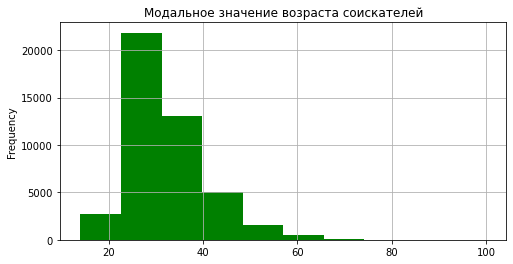

In [ ]:
hh_df['Возраст'].plot(
    kind = 'hist',
    figsize = (8, 4),
    title = 'Модальное значение возраста соискателей',
    grid = True,
    color = 'green',
    bins = 10
);

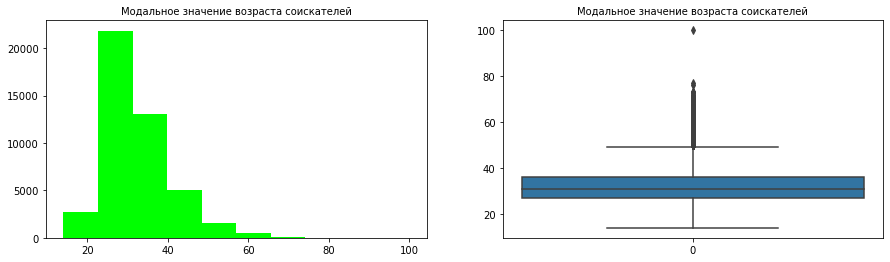

In [ ]:
# визуализация систем координат
age = hh_df['Возраст']

# визуализация систем координат
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))


# гистограмма
axes[0].hist(
    x=age, label=['Возраст'], color="lime", bins=10
)
axes[0].set_title("Модальное значение возраста соискателей", fontsize = 10)
axes[0].xaxis.set_tick_params(rotation=0) 

# коробчатая диаграмма
axes[1].boxplot = sns.boxplot(
    data=age,
    
    orient='v',
    width=0.9
)
axes[1].boxplot.set_title('Модальное значение возраста соискателей', fontsize = 10)
axes[1].xaxis.set_tick_params(rotation=0)                       

### Комментарии:
1) Чему равна мода распределения?

- мода распределения равна 30

2) Каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей?

- примерный интервал находится в промежутке между 25 и 30 лет возраста большинства соискателей

3) Есть ли аномалии для данного признака? Если есть, то какие значения вы бы причислили к таковым?

- аномалии видно в том, что у нас есть внушительное количество соискателей в возрасте от 60 до 80 лет

- а также есть замечательный человек, доживший до 100 лет и желающий работать (наверно, в графике 24/7)

### Задание 4.2

Чему равен максимальный опыт работы (в месяцах)?

### Постройте распределение признака **«Опыт работы (месяц)»**. 
Опишите распределение, отвечая на следующие вопросы:

Чему равна мода распределения?

Каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей?

Есть ли аномалии для признака? Если есть, то какие значения вы бы причислили к таковым?

Совет:
Постройте гистограмму и коробчатую диаграмму рядом.

In [ ]:
work_experience = hh_df['Опыт работы (месяц)'].nlargest()
work_experience

40015    1188.0
3293      663.0
10044     653.0
44363     622.0
25135     586.0
Name: Опыт работы (месяц), dtype: float64

In [ ]:
print(1188/12, '!','лет работы!!!', 'good job!!!')

99.0 ! лет работы!!! good job!!!


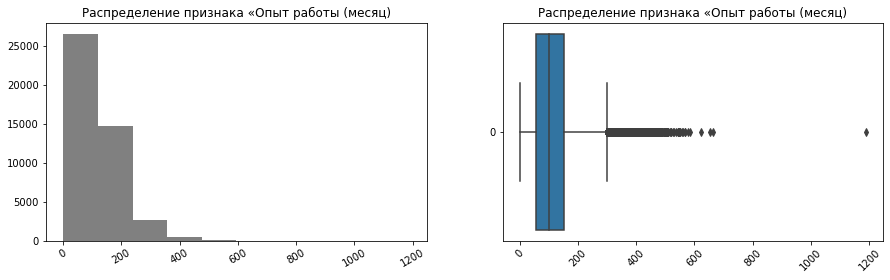

In [ ]:
work_experience = hh_df['Опыт работы (месяц)']

# визуализация систем координат
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))


# гистограмма
axes[0].hist(
    x=work_experience, 
    label=['Опыт работы (месяц)'], 
    color="Gray",
    bins=10
);
axes[0].set_title("Распределение признака «Опыт работы (месяц)", fontsize = 12)
axes[0].xaxis.set_tick_params(rotation=30) 

# коробчатая диаграмма
axes[1].boxplot = sns.boxplot(
    data=work_experience,
      
    orient='h',
    width=0.9
);
axes[1].boxplot.set_title('Распределение признака «Опыт работы (месяц)', fontsize = 12)
axes[1].xaxis.set_tick_params(rotation=45)

In [ ]:
# Эталонное решение!!!

fig = px.histogram(
    data_frame=hh_df,
    x='Опыт работы (месяц)',
    title='Распределение опыта работы соискателей',
    histnorm='percent',
    width=500,
    marginal='box',
    
)
fig.show()
fig.write_html("plotly/work_exper_3d.html")

In [ ]:
hh_df['Опыт работы (месяц)'].mode()

0    81.0
dtype: float64

### Комментарии:
1) Чему равна мода распределения? 
- 1188

2) Каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей?
- 80 - 82 месяца

3) Есть ли аномалии для признака? Если есть, то какие значения вы бы причислили к таковым?
- у нас есть человек с опытом работы 1188 месяцев (это 99 лет!!!)

### Задание 4.3

Определите по графику, сколько соискателей требуют заработную плату выше 1 миллиона рублей.

In [ ]:
print('желаемая заработная плата выше 1 миллиона рублей у', hh_df[hh_df['ЗП (руб)'] > 1000000].shape[0], 'соискателей')

желаемая заработная плата выше 1 миллиона рублей у 5 соискателей


In [ ]:
wage = hh_df[hh_df['ЗП (руб)'] < 1000000]
fig = px.histogram(
    data_frame=hh_df,
    x='ЗП (руб)',
    title='Распределение желаемой з/п соискателей',
    histnorm='percent',
    width=500,
    marginal='box'
)
fig.show()
fig.write_html("plotly/wage_exp_3d.html")

### Комментарии

Есть ли аномалии для признака заработной платы? Если есть, то какие значения вы бы причислили к таковым?
- стоит проверить информацию по самой высокой зарплате,
- хотя, судя до должности соискателя, вероятно, она может быть коррекная

### Задание 4.4

Какая категория образования оплачивается выше всех по медианному показателю?

### Постройте диаграмму, которая показывает зависимость медианной желаемой заработной платы («ЗП (руб)») от уровня образования («Образование»).

Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 миллиона рублей.

Сделайте выводы по представленной диаграмме:

Для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы?

Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?

In [ ]:
# Какая категория образования оплачивается выше всех по медианному показателю?
paiment = hh_df.groupby(by='Образование')['ЗП (руб)'].median()
display('Зависимость ЗП от образования по медианному показателю', paiment)

'Зависимость ЗП от образования по медианному показателю'

Образование
Высшее                 60000.0
Неоконченное высшее    50000.0
Среднее                40000.0
Среднее специальное    40000.0
Name: ЗП (руб), dtype: float64

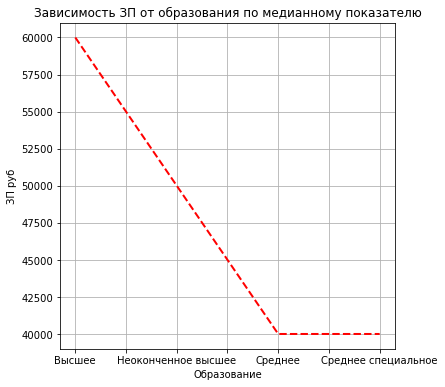

In [ ]:
# посторим линейный график
# 'Зависимость ЗП от образования по медианному показателю'
fig, axes = plt.subplots(figsize=(6,6))
paiment.plot(
    kind='line',
    ax=axes,
    ls = '--',
    lw = 2,
    color = 'red'
);
axes.set_title('Зависимость ЗП от образования по медианному показателю')
axes.set_xlabel('Образование')
axes.set_ylabel('ЗП руб')
axes.tick_params(axis='x', labelrotation = 0)
axes.grid()

### Комментарии

Для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы?
- из графика мы наблюдаем, что уровень ЗП зависит от уровня образования
- на рынке труда соискатели с высшим и с неоконченным высшим образованием могут расчитывать на высокий уровень ЗП
- соискатели со средним и средним специальным образованием по уровню ЗП идут на одинаковом уровне по медианному показателю

Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?
- на данном графике видно, что уровень образования важен при прогнозировании заработной платы
- работадатель будет ориентироваться на данный признак

In [ ]:
# эталонное решение
bar_data = hh_df[hh_df['ЗП (руб)']<1e6].groupby('Образование', as_index=False).median()
display('Зависимость ЗП от образования по медианному показателю', bar_data)

'Зависимость ЗП от образования по медианному показателю'

,Образование,Возраст,Опыт работы (месяц),Готовность к переезду,Готовность к командировкам,полная занятость,полный день,частичная занятость,сменный график,проектная работа,гибкий график,волонтерство,удаленная работа,стажировка,вахтовый метод,ЗП (руб)
0,Высшее,31.0,109.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60000.0
1,Неоконченное высшее,28.0,77.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50000.0
2,Среднее,29.0,72.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40000.0
3,Среднее специальное,28.0,68.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,40000.0


In [ ]:
# построим столбчатую диаграмму 
# 'Медианная з/п по уровню образования'
fig = px.bar(
    data_frame=bar_data,
    x='Образование',
    y='ЗП (руб)',
    title='Медианная з/п по уровню образования'
)
fig.show()
fig.write_html("plotly/wage_median_3d.html")

### Задание 4.5

В каком городе (категории городов) зафиксирован наибольший показатель желаемой заработной платы (~924 тысячи рублей)?

In [ ]:
# выведем коробчатую диаграмму 
# 'Распределение з/п по городам'

box_data = hh_df[hh_df['ЗП (руб)']<1e6]
fig = px.box(
    data_frame=box_data,
    x='Город',
    y='ЗП (руб)',
    color='Город',
    title='Распределение з/п по городам'
)
fig.show()
fig.write_html("plotly/wage_city_3d.html")

# ответ: другие

### Постройте диаграмму, которая показывает распределение желаемой заработной платы («ЗП (руб)») в зависимости от города («Город»). 

Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 миллиона рублей.

Сделайте выводы по полученной диаграмме:

**Выводы**

Как соотносятся медианные уровни желаемой заработной платы и их размах в городах?

- практически во всех городах мы наблюдаем медиану = 35-40К

- явно лидирует г.Москава  по медианному показателю 

- по размаху ЗП видно, что Воронеж находится на последнем месте, хотя его медиана составляет 40К

- в категории "другие" наблюдается самый высокий уровень зарплат. Вероятно, после исследования станет понятна его причина

Как вы считаете, важен ли признак города при прогнозировании заработной платы?

- При прогназировании ЗП данный признак можно обозначить, как главный влияющий показатель

### Постройте многоуровневую столбчатую диаграмму, 
которая показывает зависимость медианной заработной платы («ЗП (руб)») от признаков «Готовность к переезду» и «Готовность к командировкам». Проанализируйте график, сравнив уровень заработной платы по категориям.

In [ ]:
# делаем сводную таблицу
pivot = hh_df.pivot_table(
    'ЗП (руб)',
    index='Готовность к переезду',
    columns='Готовность к командировкам',
    aggfunc='median'
)
pivot

Готовность к командировкам,False,True
Готовность к переезду,,
False,40000.0,60000.0
True,50000.0,65000.0


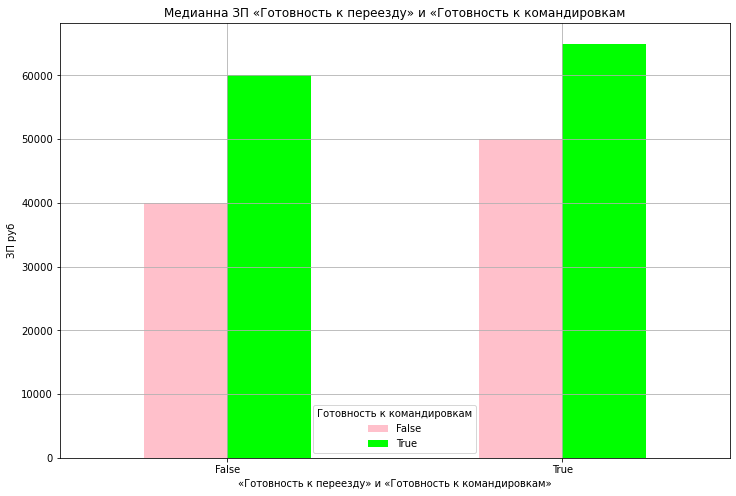

In [ ]:
# создаем столбчатую диаграмму
# 'Медианна ЗП «Готовность к переезду» и «Готовность к командировкам'

fig, axes = plt.subplots(figsize=(12, 8))
pivot.plot(
    kind='bar',
    ax=axes,
    color = ['pink', 'lime']
);

axes.set_title('Медианна ЗП «Готовность к переезду» и «Готовность к командировкам')
axes.set_xlabel('«Готовность к переезду» и «Готовность к командировкам»')
axes.set_ylabel('ЗП руб')
axes.tick_params(axis='x', labelrotation = 0)
axes.grid()

### Комментарии

- соискатели готовы к переезду, если уровень ЗП начинается от 40К, и командировкам, если ЗП начинается от 50К

- соискатели не готовы к переезду, если ЗП меньше 40К, и командировкам, если ЗП меньше 50К

### Задание 4.6

Чему равна желаемая медианная заработная плата соискателей, готовых и к переезду, и к командировкам? Ответ приведите в тысячах, округлив до целого (например, 45).

In [ ]:
# эталонное решение
bar_data = hh_df.groupby(
    ['Готовность к командировкам', 'Готовность к переезду'],
    as_index=False
)['ЗП (руб)'].median()
fig = px.bar(
    data_frame=bar_data,
    y='Готовность к переезду',
    x='ЗП (руб)',
    barmode="group",
    color='Готовность к командировкам',
    orientation='h',
    title='Медианная з/п по готовности к командировкам/переезду'
)
fig.show()
fig.write_html("plotly/trip_ready_3d.html")

# 66

### Постройте сводную таблицу, иллюстрирующую зависимость медианной желаемой заработной платы от возраста («Возраст») и образования («Образование»).

По полученной сводной таблице постройте тепловую карту.

Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [ ]:
# построим сводную таблицу зависимости медианной желаемой ЗП от возраста

heatmap_data = hh_df.pivot_table(
    'ЗП (руб)',
    index='Возраст',
    columns='Образование',
    aggfunc='median',
    fill_value=0
)
#display('Сводная таблица зависимости медианной желаемой ЗП от возраста', heatmap_data)

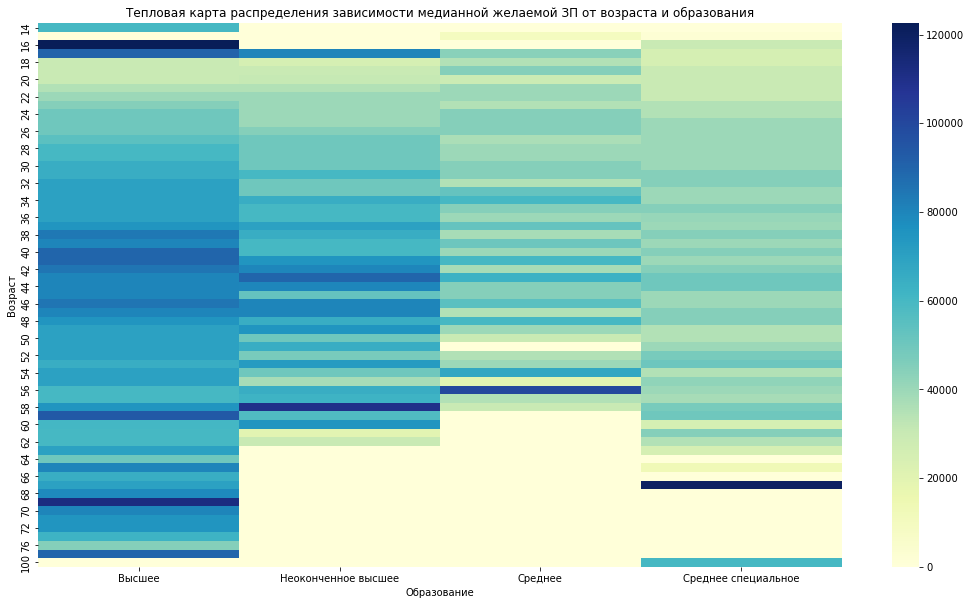

In [ ]:
# создадим тепловую карту
# 'Тепловая карта распределения зависимости медианной желаемой ЗП от возраста и образования'

fig, axes = plt.subplots(figsize=(18, 10))
heatmap = sns.heatmap(data=heatmap_data, ax=axes, cmap='YlGnBu')
heatmap.set_title('Тепловая карта распределения зависимости медианной желаемой ЗП от возраста и образования');
heatmap.set_ylabel('Возраст')
heatmap.set_xlabel('Образование');

### Комментарии

- тепловая карта нам показывает, что в диапазоне от 14 до 100 лет соискатели с высшим и неоконченным высшим образованием стабильно увеличивают свой доход, начиная где-то с 24 лет (с 20К до 100К)

- видимо, до 24 годов эти соискатели еще студенты, и занимаются подработкой, поэтому их доход не большой (пока 😊)

- однако, у нас есть два типа уникальных соискателей с 14 по 17 лет, у которых уже есть высшее образование и самый высокий уровень ЗП. Вероятно, это очень талантливые личности (дети-уникумы), или это наши данные немного над нами шутят. Это стоит проверить!!!

- Далее мы видим, что соискатели в категории неоконченное высшее и высшее до 45 лет идут практически на одном уровне по ЗП, а после 45 лет люди с высшим образованием "вырываются вперёд" и остаются востребованными на рынке труда с высокой ЗП до 100 лет. 

- Это тоже требует дополнительной, т.к. данные по соискателям неоконченного высшего после 62 лет у нас потерялись, и мы не можем сравнить данные

- Соискатели в категории среднее и среднее специальное образование с 14 до 60 лет (далее данные явно отображаются не корректно) стабильно зарабатывают от 20К до 56К

- с 14 до 24 лет, как и соискатели в высшим и неоконченным высшим образованием, их доход в среднем можно определить 20К - 30К

как общее заключение:
- чем моложе соискатель, тем он дешевле на рынке труда (нет опыта работы, требуемого образования и т.п.)
- высшее образование является весомым показателем для желаемого уровня ЗП
- возраст от 24 до 48 можно оценить, как "опыт работы", поэтому видно, что в этот промежуток медианна желаемой заработной платы относительно высока

### Задание 4.7

Для какой категории образования наблюдается самый быстрый карьерный рост (то есть интенсивность роста заработной платы наибольшая)?

In [ ]:
# посторим для сравнения ЗП на тепловой карте 
# создадим для этого сводную таблицу

pivot = hh_df.pivot_table(
    index='Образование',
    columns='Возраст',
    values='ЗП (руб)',
    aggfunc='median',
    fill_value=0
)
#pivot

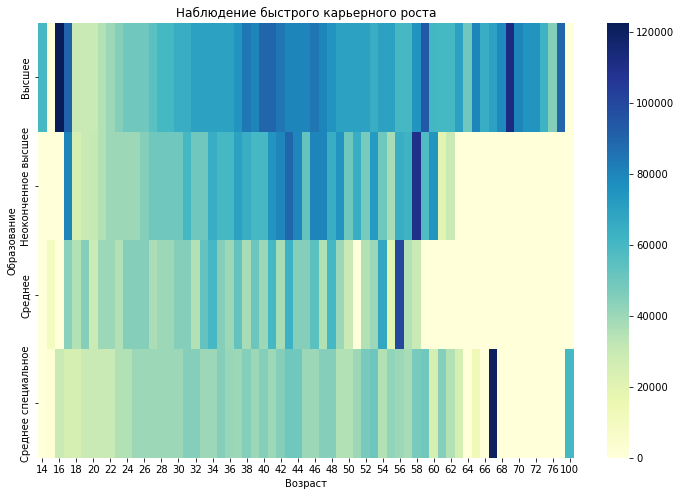

In [ ]:
fig, axes = plt.subplots(figsize=(12, 8))
heatmap = sns.heatmap(data=pivot, cmap='YlGnBu');
heatmap.set_title('Наблюдение быстрого карьерного роста', fontsize=12);

### Комментарии
- самый быстрый карьерный рост наблюдается у соискателей с высшим образованием

In [ ]:
# эталонное решение
# Тепловая карта

fig = px.imshow(
    pivot,
    aspect='auto',
    color_continuous_scale='greens',
    title='Медианная з/п по образованию и возрасту'
)
#fig.show()

### Задание 4.8

Сколько точек лежат строго выше построенной прямой? Так как точки могут сливаться с прямой, то для ответа на этот вопрос проще всего воспользоваться интерактивной визуализацией либо получить таблицу с наблюдениями, лежащими выше прямой с помощью фильтрации.

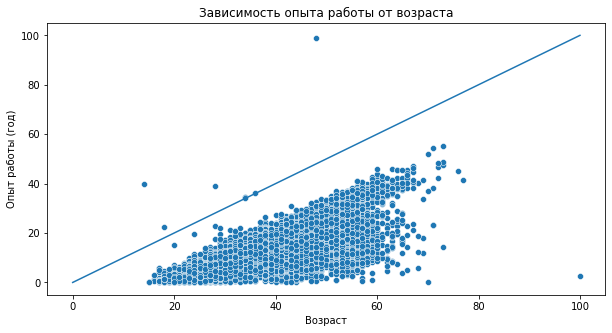

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(10, 5))
scatter_data = hh_df.copy()
scatter_data['Опыт работы (год)'] = scatter_data['Опыт работы (месяц)']/12

sns.lineplot(x=[0, 100], y=[0, 100])
ax = sns.scatterplot(
    data=scatter_data, 
    x='Возраст',
    y='Опыт работы (год)',
)
ax.set_title('Зависимость опыта работы от возраста');

# ответ: 7

### Комментарии
- ответ 7

**Для получения двух дополнительных баллов** по разведывательному анализу постройте ещё два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков.

Приведите выводы по ним. 

Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее, в разделе Преобразование данных.

### 1) Зависимость признаков Пола и ЗП

In [ ]:
# как пол человека влияет на ЗП
gender_vs_wage = hh_df.groupby('Пол')['ЗП (руб)'].count()
gender_vs_wage
# в базе данных мужчин больше, чем женшин

Пол
Ж     8533
М    36211
Name: ЗП (руб), dtype: int64

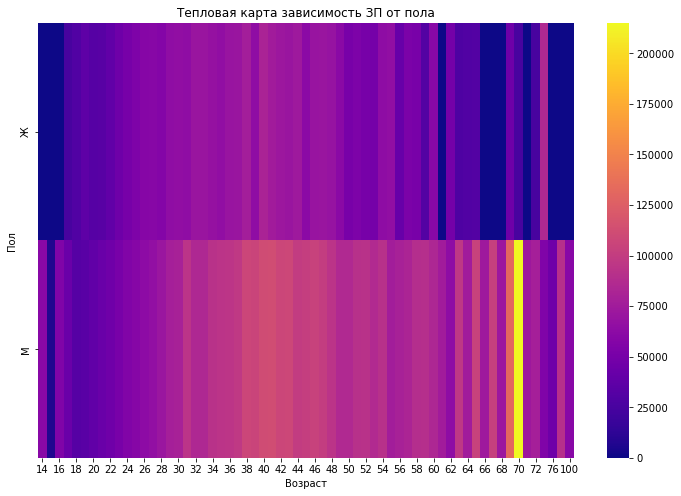

In [ ]:
# создадим тепловую карту
# 'Тепловая карта зависимость ЗП от пола'

fig, axes = plt.subplots(figsize=(12, 8))
pivot = hh_df.pivot_table(
    index='Пол',
    columns='Возраст',
    values='ЗП (руб)',
    aggfunc='mean',
    fill_value=0
);

heatmap = sns.heatmap(data=pivot, cmap='plasma');
heatmap.set_title('Тепловая карта зависимость ЗП от пола', fontsize=12);

### Комментарии:
- Из тепловой карты можно увидеть, что у мужчин уровень желаемой ЗП намного лучше, чем у женщин
- а к 70 годам зартплата у мужчин в 200 раз лучше, чем у женщин. (Но это надо проверить!!!)
- в диапазоне с 38 до 44 лет уровень желаемой ЗП немного выравнивается между соискателями разного пола
- однако, после 60 лет ЗП женщин резко падает (причиной может быть то, что дама становится бабушкой, и сама не заинтересована в работе, а планирует посвятить свою жизнь внукам 😊 или начать путешествовать)
- у мужчин после 60 лет параметр ЗП остается стабильным, и падение наблюдается после 75
- из общей картины видно, что до 28 годов и женщины, и мужчины не сильно отличаются по желаемой шкале ЗП

### 2) Зависимость признаков ЗП и волонтерство

In [ ]:
# Посмотрим, в каком городе больше волонтеров

# построим для сравнения столбчатую диаграмму

# создаем сводную таблицу и произведем подсчёт по медиане

pivot_df = hh_df.pivot_table(
    index='Город',
    columns='волонтерство',
    values='ЗП (руб)',
    aggfunc='median',
    fill_value=0
);
#print(pivot_df)

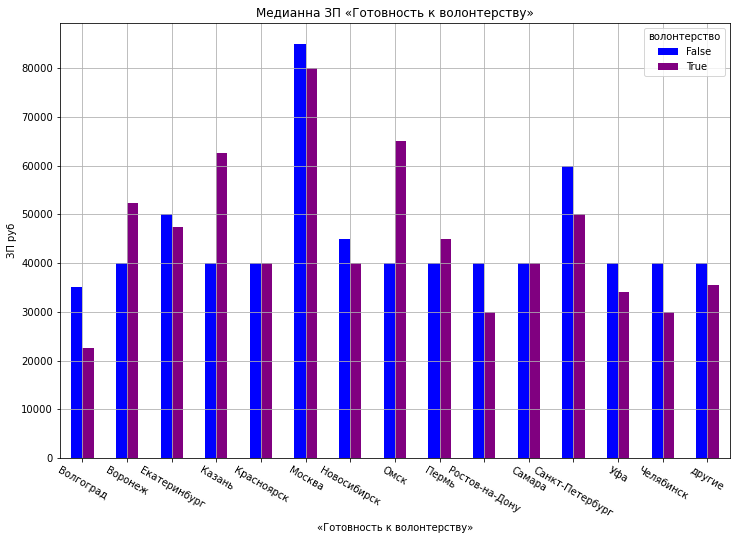

In [ ]:
fig, axes = plt.subplots(figsize=(12, 8))
pivot_df.plot(
    kind='bar',
    ax=axes,
    color = ['blue', 'purple']
);
axes.set_title('Медианна ЗП «Готовность к волонтерству»')
axes.set_xlabel('«Готовность к волонтерству»')
axes.set_ylabel('ЗП руб')
axes.tick_params(axis='x', labelrotation = -30)
axes.grid()

### Комментарии

- Из графика мы можем получить информацию о городах, где соискатели готовы или не готовы выполнять работу, как волонтеры
- такие города, как Казань, Омск, Воронеж и Пермь демонстрируют высокий уровень готовности к волонтерству
> вспомним наш график 'Распределение з/п по городам', котрый мы составили ранее (см.его дубликат ниже)
- не сложно заметить, что данные 4 города находятся практически в одной весовой категории по ЗП
- Вероятно, волонтерство в этих городах занимает особую долю рынка труда (гос.поддержка, активная позиция самих граждан)
- в других городах ситуация по готовности стать волонтером равна примерно 50/50 (1/2 соискателей готовы к волонтёрству)
- в Волгогдраде и Челябинске мы можем наблюдать низкий уровень готовности соискателей к волонтёрству

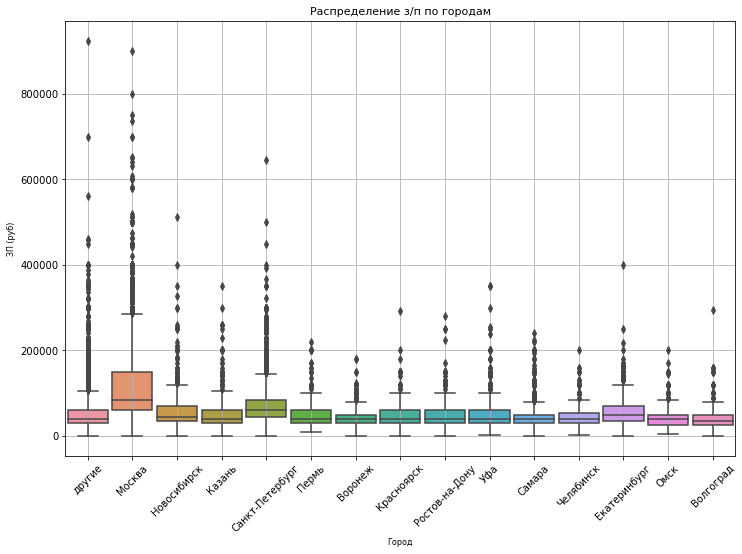

In [ ]:
# Для удобства сраснения повторим график 'Распределение з/п по городам', но уже в plt варианте, до этого он был px
fig, axes = plt.subplots(figsize=(12, 8))
boxplot = sns.boxplot(
    data = box_data,
    x = 'Город',
    y = 'ЗП (руб)',
    orient= 'v',
    width = 0.9
);
boxplot.set_title('Распределение з/п по городам', fontsize = 11);
boxplot.set_xlabel('Город', fontsize = 8);
boxplot.set_ylabel('ЗП (руб)', fontsize = 8);
boxplot.tick_params(axis='x', labelrotation = 45);
boxplot.grid()

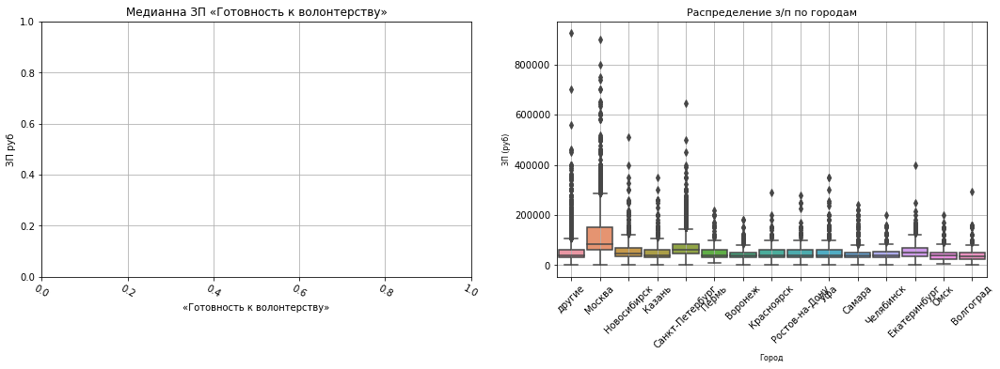

In [ ]:
# сравним два наших графика для наглядности

fig, axes  = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))
# график не хочет отобрачаться....(причину еще выясняю)
#axes[0].pivot_df.plot(
    #kind='bar',
    #ax=axes,
    #color = ['blue', 'purple']
#);

axes[0].set_title('Медианна ЗП «Готовность к волонтерству»')
axes[0].set_xlabel('«Готовность к волонтерству»')
axes[0].set_ylabel('ЗП руб')
axes[0].tick_params(axis='x', labelrotation = -30)
axes[0].grid()


axes[1].boxplot = sns.boxplot(
    data = box_data,
    x = 'Город',
    y = 'ЗП (руб)',
    orient= 'v',
    width = 0.9
);
axes[1].boxplot.set_title('Распределение з/п по городам', fontsize = 11);
axes[1].boxplot.set_xlabel('Город', fontsize = 8);
axes[1].boxplot.set_ylabel('ЗП (руб)', fontsize = 8);
axes[1].boxplot.tick_params(axis='x', labelrotation = 45);
axes[1].boxplot.grid()

# 4.Очистка данных

 🐍 Когда мы проводили визуальный анализ, мы нашли несколько несостыковок в данных: пропуски, гигантские размеры желаемых заработных плат, резюме людей слишком «преклонного» возраста, опыт работы, превышающий возраст.

### Всё это говорит о том, что данные подлежат очистке 

### Задание 5.1

Начнём с дубликатов в наших данных. Найдите полные дубликаты в таблице с резюме и удалите их.

Сколько полных копий удалось найти?

In [ ]:
duplicates = hh_df[hh_df.duplicated(subset=hh_df.columns)]
hh_df = hh_df.drop_duplicates()
print(duplicates.shape[0])

161


### ⚡ Важно! Дальнейшая работа производится с очищенными от дубликатов данными.

In [ ]:
null_data = hh_df.isnull().sum()
display(null_data[null_data > 0])

Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Опыт работы (месяц)                168
dtype: int64

Итак, у нас есть пропуски в трёх столбцах: «Опыт работы (месяц)», «Последнее/нынешнее место работы», «Последняя/нынешняя должность». 

Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью.

Пропуски в столбце с опытом работы заполните медианным значением

### Задание 5.3

Чему равно результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков? Ответ округлите до целых.

In [ ]:
hh_df = hh_df.dropna(subset=['Последнее/нынешнее место работы', 'Последняя/нынешняя должность'])
hh_df['Опыт работы (месяц)'] = hh_df['Опыт работы (месяц)'].fillna(hh_df['Опыт работы (месяц)'].median())
print(round(hh_df['Опыт работы (месяц)'].mean()))

114


### ⚡ Важно! Дальнейшая работа производится с очищенными от дубликатов и пропусков данными.

Мы добрались до ликвидации выбросов. Сначала очистим данные вручную.

Удалите резюме, в которых указана заработная плата либо выше 1 миллиона рублей, либо ниже 1 тысячи рублей.

In [ ]:
outliers = hh_df[(hh_df['ЗП (руб)'] > 1e6) | (hh_df['ЗП (руб)'] < 1e3)]
hh_df = hh_df.drop(outliers.index)
print(outliers.shape[0])

89


В процессе разведывательного анализа мы обнаружили резюме, в которых опыт работы в годах превышал возраст соискателя. 

Найдите такие резюме и удалите их из данных.

In [ ]:
outliers = hh_df[hh_df['Опыт работы (месяц)']/12 >= hh_df['Возраст']]
hh_df = hh_df.drop(outliers.index)
print(outliers.shape[0])

7


**В результате анализа мы обнаружили потенциальные выбросы в признаке Возраст** 

Это оказались резюме людей, чей возраст слишком преклонный для поиска работы.

Попробуйте построить распределение признака в логарифмическом масштабе. Добавьте к графику линии, отображающие среднее и границы интервала метода трёх сигм. 

Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

**histplot.axvline(log_age.mean(), color='k', lw=2)**

В какую сторону асимметрично логарифмическое распределение? 

Напишите об этом в комментарии к графику.

Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. 

Давайте сделаем "послабление" на 1 сигму (возьмите 4 сигмы) в правую сторону. 

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

### Задание 5.6

Сколько выбросов вы нашли с помощью метода z-отклонений?

3


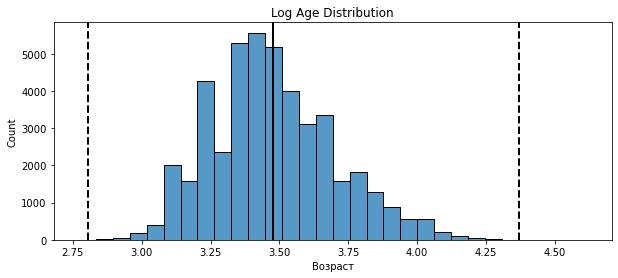

In [ ]:
# построим распределение признака "Возраст" в логарифмическом масштабе. 
# и добавим  к графику линии, отображающие среднее и границы интервала метода трёх сигм

ig, ax = plt.subplots(1, 1, figsize=(10, 4))
log_age = np.log(hh_df['Возраст'] + 1)
histplot = sns.histplot(log_age, bins=30, ax=ax)
histplot.axvline(log_age.mean(), color='k', lw=2)
histplot.axvline(log_age.mean()+ 4 *log_age.std(), color='k', ls='--', lw=2)
histplot.axvline(log_age.mean()- 3 *log_age.std(), color='k', ls='--', lw=2)
histplot.set_title('Log Age Distribution');

def outliers_z_score_mod(data, feature, left=3, right=3, log_scale=False):
    if log_scale:
        x = np.log(hh_df[feature]+1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = hh_df[(x < lower_bound) | (x > upper_bound)]
    cleaned = hh_df[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned
outliers, hh_df = outliers_z_score_mod(hh_df, 'Возраст', left=3,  right=4, log_scale=True)
print(outliers.shape[0])

### Комментарии

В какую сторону асимметрично логарифмическое распределение?
- ассиметрия наблюдается с правой стороны от средней линии



### Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

In [ ]:
display(outliers['Возраст'].nlargest())

Series([], Name: Возраст, dtype: int64)

In [ ]:
# посмотрим на нашу новую преобразованную таблицу
#display(hh_df.head(3))

## спасибо за Ваше время и ценные комментарии !!!!